# __DESARROLLADO POR: ENRIQUE CALLE PRADO__

In [1]:
## ===> Librerias para la manipulación de datos
import pandas as pd
import numpy as np

## ==> Librerias para los graficos
import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

## ==> Librerias a niveles estadisticos
from scipy.stats import gaussian_kde
from scipy.stats import chi2_contingency, chi2

## ==> Librerias para el procesamiento ML
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.model_selection import train_test_split,RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier 
import sklearn.metrics as sk_metrics
from sklearn.metrics import classification_report

## ==> Configuraciones internas (evitar mensajes de advertencias)
import warnings

## ===> Diccionario que tiene los colores para los graficos
colors_eda = {
    'histogram' : '#13A9C1',
    'density' : '#13A9C1',
    'boxplot' : '#66AA04',
    'pie' : '4200AF'
}

## __IMPORTANDO LOS DATOS__

In [2]:
df_tc = pd.read_excel('bbdd_clientes_tarjeta_credito.xlsx')
df_tc

,ID,MONT_CREDIT,EST_CIVIL,NIV_EDUC,SEX,AGE,PAY_1,PAY_2,PAY_3,BILL_AMT1,BILL_AMT2,BILL_AMT3,PAY_AMT1,PAY_AMT2,PAY_AMT3,ES_NOPAGO
0,1,30000.0,1,1,2,40,0,0,0,24607.0,24430.0,23881.0,1700.0,1600.0,1287.0,0
1,2,20000.0,1,1,2,41,1,2,0,17040.0,16474.0,17203.0,0.0,1300.0,1500.0,0
2,3,20000.0,1,1,2,36,0,0,0,17332.0,18600.0,17947.0,1580.0,1367.0,1178.0,0
3,4,20000.0,1,1,2,35,0,0,0,2003.0,2948.0,3372.0,1086.0,1000.0,0.0,0
4,5,170000.0,1,1,2,38,0,0,0,171465.0,145196.0,110163.0,18500.0,13998.0,3760.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16620,16621,350000.0,1,2,1,56,3,2,2,2500.0,2500.0,2500.0,0.0,0.0,0.0,1
16621,16622,380000.0,2,2,1,60,2,2,2,72557.0,77708.0,79384.0,7000.0,3500.0,0.0,1
16622,16623,340000.0,2,2,1,56,4,3,2,3565.0,3356.0,2758.0,0.0,0.0,22000.0,1
16623,16624,430000.0,1,1,1,61,1,0,0,-1645.0,78379.0,76304.0,85900.0,3409.0,1178.0,1


## __TRANSFORMACIÓN DE LOS DATOS__

In [3]:
## ====> Verificando NULOS
df_tc.isnull().sum(),df_tc.duplicated().sum()

(ID             0
 MONT_CREDIT    0
 EST_CIVIL      0
 NIV_EDUC       0
 SEX            0
 AGE            0
 PAY_1          0
 PAY_2          0
 PAY_3          0
 BILL_AMT1      0
 BILL_AMT2      0
 BILL_AMT3      0
 PAY_AMT1       0
 PAY_AMT2       0
 PAY_AMT3       0
 ES_NOPAGO      0
 dtype: int64,
 0)

In [4]:
# ====> Transformo algunas variables a categóricas con el objetivo de obtener una mejor visualización de los datos 
rp_est_civil = {
    1 : 'casado',
    2 : 'soltero',
    3 : 'otros'
}
rp_niv_edu = {
    1 : 'posgrado',
    2 : 'universidad',
    3 : 'escuela secundaria',
    4 : 'otros',
    5 : 'desconocido',
    6 : 'desconocido',
}
rp_niv_sex = {
    1 : 'musculino',
    2 : 'femenino'
}
rp_es_nopago = {
    1 : 'no_pago',
    0 : 'si_pago'
}
rp_pay = {
    0 : 'pago debido',#No existe -1 en la tabla, y si cambio las variables a categoricas veo hay un 0 al convertir, entonces ese debe ser "Pago debido", por lo que se reemplaza. 
    1 : 'retraso en el pago de un mes',
    2 : 'retraso en el pago de dos meses',
    3 : 'retraso en el pago de tres mes',
    4 : 'retraso en el pago de cuatro meses',
    5 : 'retraso en el pago de cinco meses',
    6 : 'retraso en el pago de seis meses',
    7 : 'retraso en el pago de siete meses',
    8 : 'retraso en el pago de ocho meses',
    9 : 'retraso en el pago de nueve meses o mas',
}

df_tc['EST_CIVIL'] = df_tc['EST_CIVIL'].replace(rp_est_civil) 
df_tc['NIV_EDUC'] = df_tc['NIV_EDUC'].replace(rp_niv_edu) 
df_tc['SEX'] = df_tc['SEX'].replace(rp_niv_sex) 
df_tc['ES_NOPAGO'] = df_tc['ES_NOPAGO'].replace(rp_es_nopago) 
df_tc[['PAY_1','PAY_2','PAY_3']] = df_tc[['PAY_1','PAY_2','PAY_3']].replace(rp_pay) 

In [5]:
#==> Funcion para cambiar el tipo de dato de la variable objetivo
# Type
# O : Ordinal (1,0)
# C : Category (No pago, Si pago)
def change_type_target(column : pd.Series, type : str) -> pd.Series :
    if type == 'O':
        rp_es_nopago_inverse = {v : k for k,v in rp_es_nopago.items()}
    else:
        rp_es_nopago_inverse = {k : v for k,v in rp_es_nopago.items()}
    column = column.replace(rp_es_nopago_inverse)
    return column         

In [6]:
df_tc.drop(columns=['ID'],inplace=True)
df_tc.head(2)

,MONT_CREDIT,EST_CIVIL,NIV_EDUC,SEX,AGE,PAY_1,PAY_2,PAY_3,BILL_AMT1,BILL_AMT2,BILL_AMT3,PAY_AMT1,PAY_AMT2,PAY_AMT3,ES_NOPAGO
0,30000.0,casado,posgrado,femenino,40,pago debido,pago debido,pago debido,24607.0,24430.0,23881.0,1700.0,1600.0,1287.0,si_pago
1,20000.0,casado,posgrado,femenino,41,retraso en el pago de un mes,retraso en el pago de dos meses,pago debido,17040.0,16474.0,17203.0,0.0,1300.0,1500.0,si_pago


## __VISUALIZACIÓN DE LOS DATOS (BI)__

In [7]:
df_bi = df_tc.copy()

In [8]:
## ==> Gráfico para la visualización univariada de datos numéricos
def visualization_num_univariado(df):
    columns = df.columns
    rows = len(columns)
    cols = 3
    subplot_titles = []
    for column in columns:
        subplot_titles.extend([f'Histograma de {column}', f'Densidad de {column}', f'Boxplot de {column}'])
    
    fig = make_subplots(rows = rows, cols = 3,subplot_titles=subplot_titles)
    col = 1
    row = 1

    for column in columns:
        #obtener de densidad
        kde = gaussian_kde(df[column])
        x_range = np.linspace(df[column].min(), df[column].max(), 100)
        kde_values = kde(x_range)
        #obtener numero de bins
        num_bins_sqrt = int(np.ceil(np.ceil(np.sqrt(len(df[column])))))

        fig.add_trace(
            go.Histogram(x = df[column], nbinsx=num_bins_sqrt, marker_color=colors_eda['histogram']), row= row, col = col
        )
        col = col + 1

        fig.add_trace(
            go.Scatter(x = x_range, y = kde_values, mode = 'lines', line=dict(color = colors_eda['density'])), row= row, col = col
        )
        col = col + 1

        fig.add_trace(
            go.Box(y=df[column], marker_color=colors_eda['boxplot']), row = row, col=col
        )
        
        if col == cols:
            row = row + 1 
            col = 1
            
        fig.update_layout(
            height=300*rows, 
            width=1000,
            #title_text=f'Distribución de la variable {column}', 
            showlegend=False,
            #title = {
            #    'x' : 0.5,
            #    'y' : 0.95
            #}
        )
    fig.show()

In [9]:
## ==> Gráfico para la visualización univariada de datos categórico
def visualization_cat_univariado(df):
    columns = df.columns
    rows = len(columns)
    cols = 2
    subplot_titles = []
    specs = []
    for column in columns:
        subplot_titles.extend([f'Histograma de {column}', f'Pie de {column}'])
        specs.append([{'type': 'bar'}, {'type': 'pie'}])

    
    fig = make_subplots(rows = rows, cols = cols,subplot_titles=subplot_titles, specs = specs)
    col = 1
    row = 1
    for column in columns:

        #obtener numero de bins
        num_bins_sqrt = int(np.ceil(np.ceil(np.sqrt(len(df[column])))))

        fig.add_trace(
            go.Histogram(x = df[column], nbinsx=num_bins_sqrt, marker_color=colors_eda['histogram']), 
            row= row, col = col
        )
        col = col + 1

        labels = df_tc[column].value_counts().index
        values = df_tc[column].value_counts().values
        fig.add_trace(
            go.Pie(labels=labels, values=values),
            row= row, col = col
        )

        if col == cols:
            row = row + 1 
            col = 1

        fig.update_layout(
            height=400*rows, 
            width=1000,
 
            showlegend=False,
            #title = {
            #    'x' : 0.5,
            #    'y' : 0.95
            #}
        )
        fig.update_xaxes(
            tickangle=-45
        )
    fig.show()

__*Variables numéricas - visualizaciones univariadas*__

In [10]:
df_bi.describe()

,MONT_CREDIT,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,PAY_AMT1,PAY_AMT2,PAY_AMT3
count,16625.000000,16625.000000,16625.000000,16625.000000,16625.000000,16625.000000,16625.000000,16625.000000
mean,157608.781955,43.373955,50720.634827,48815.920662,46471.030556,5175.054075,4973.786105,4830.003368
std,124931.062684,8.777974,73365.449060,70753.129768,68182.984755,15033.589318,14867.362888,15646.002915
min,0.000000,20.000000,-165580.000000,-69777.000000,-61506.000000,0.000000,0.000000,0.000000
25%,50000.000000,37.000000,3491.000000,2997.000000,2550.000000,566.000000,451.000000,306.000000
50%,120000.000000,42.000000,21943.000000,20987.000000,19954.000000,2000.000000,2000.000000,1637.000000
75%,230000.000000,49.000000,65903.000000,62725.000000,59111.000000,5000.000000,4696.000000,4025.000000
max,800000.000000,72.000000,746814.000000,646770.000000,693131.000000,505000.000000,384986.000000,508229.000000


In [11]:
visualization_num_univariado(df_bi.select_dtypes(include=[np.number]))

__*Variables categóricas - visualizaciones univariadas*__

In [12]:
df_bi.describe(include=['object']).T

,count,unique,top,freq
EST_CIVIL,16625,3,casado,8901
NIV_EDUC,16625,4,universidad,6925
SEX,16625,2,femenino,9788
PAY_1,16625,5,pago debido,11715
PAY_2,16625,5,pago debido,13287
PAY_3,16625,5,pago debido,13534
ES_NOPAGO,16625,2,si_pago,9989


In [13]:
visualization_cat_univariado(df_bi.select_dtypes(include=['O']))

### __Conclusiones del análisis univariado__


* Se observa un pequeño desbalance en la variable objetivo “NO_PAGO”, sin embargo, este desbalance no es significativo para que nuestro modelo no pueda optimizar los resultados, de igual manera, se probara con una técnica para aumentar el peso de clase y detectar si este influye o no en los resultados.
* Notamos que el género femenino es el que posee más crédito (58.9%), con un incremento superior al masculino del 17.8%.
* Las personas normalmente pagan el crédito a tiempo. Esto nos da un indicativo de que se puede obtener información relevante con este tipo de personas. Se realizará un análisis profundo multivariado para ver su correlación con la variable objetivo.
* Notamos que el monto de crédito tiene su pico más alto entre $ 50.000 - $ 60.000 con una frecuencia de 2426.
* Así misma la edad que mas frecuencia tiene es de 38 años con un total de 924 conteos, no se observan anomalías.
* En el grafico de densidad las variables numéricas no tienen una distribución normal
* Se visualiza en el grafico de boxplot que todas las variables poseen outliers, por lo que se hará una técnica de transformación para el modelado.


__*Variables numéricas - visualizaciones multivariadas*__

In [14]:
df_bi['ES_NOPAGO'] = change_type_target(df_bi['ES_NOPAGO'],'O')

C:\Users\Dell\AppData\Local\Temp\ipykernel_5796\1800188978.py:10: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



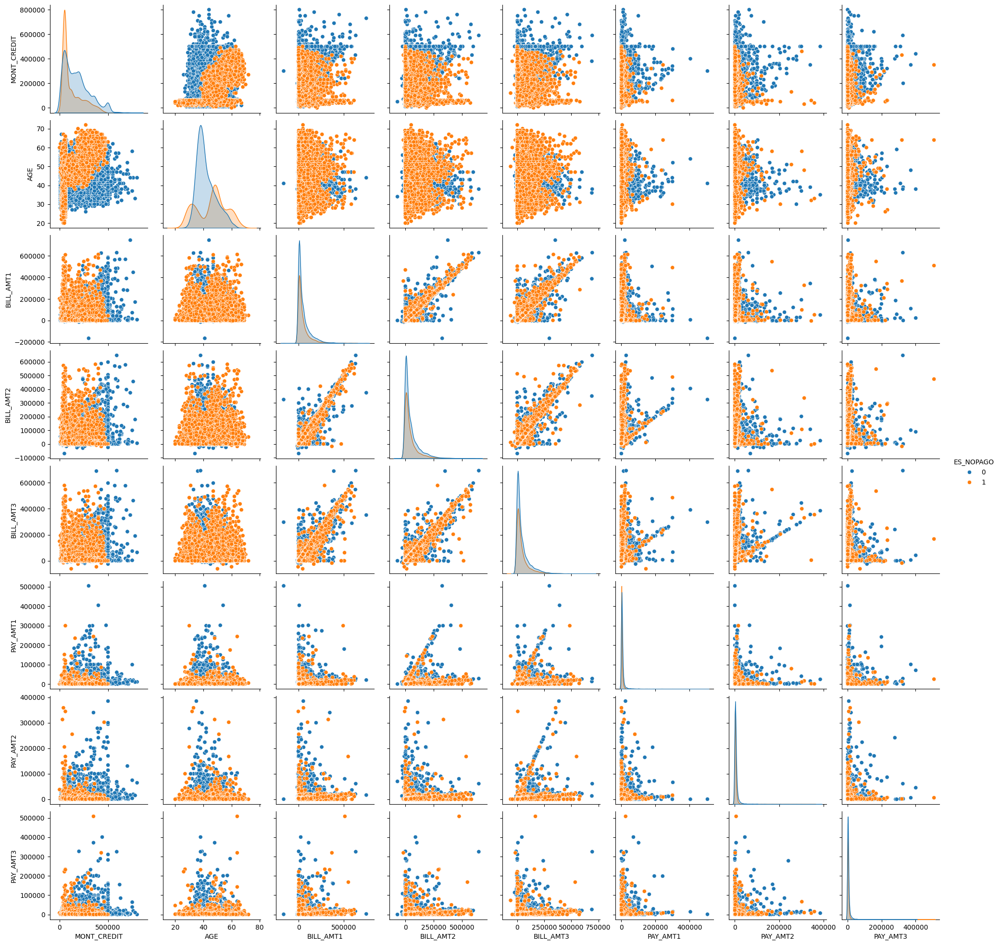

In [15]:
#Matriz de dispersión
cols_num = ['MONT_CREDIT','AGE','BILL_AMT1','BILL_AMT2','BILL_AMT3','PAY_AMT1','PAY_AMT2','PAY_AMT3','ES_NOPAGO']
sns.pairplot(df_bi[cols_num], hue='ES_NOPAGO')
plt.show()

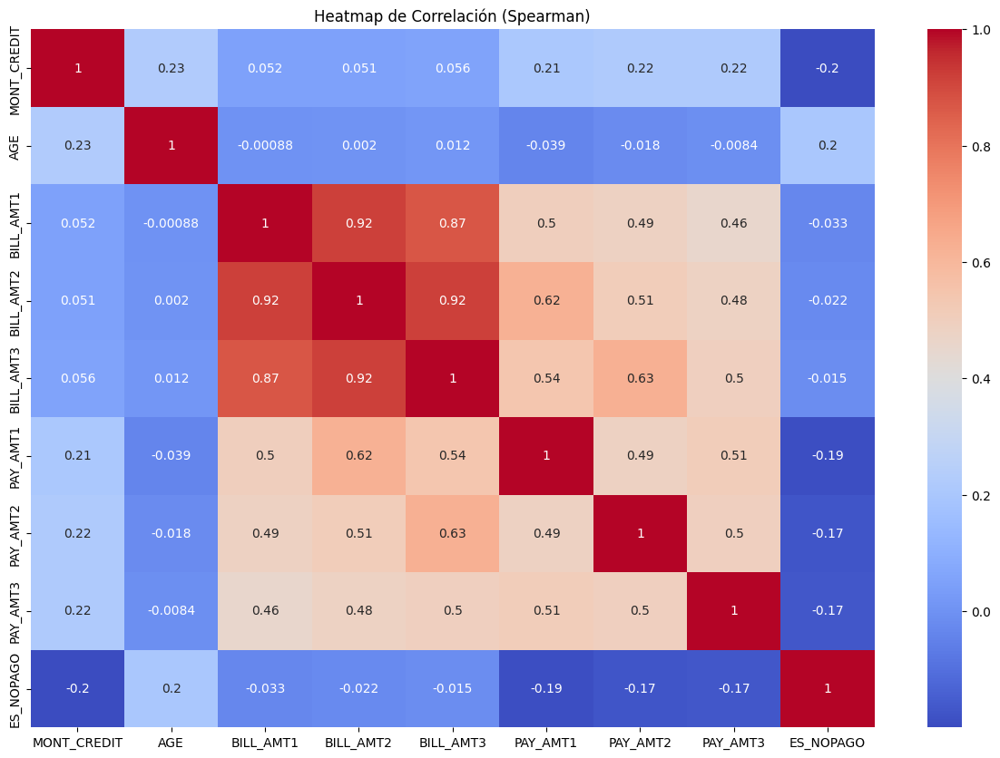

In [16]:
plt.figure(figsize=(15,10))
correlation_matrix = df_bi[cols_num].corr(method='spearman')
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Heatmap de Correlación (Spearman)')
plt.show()

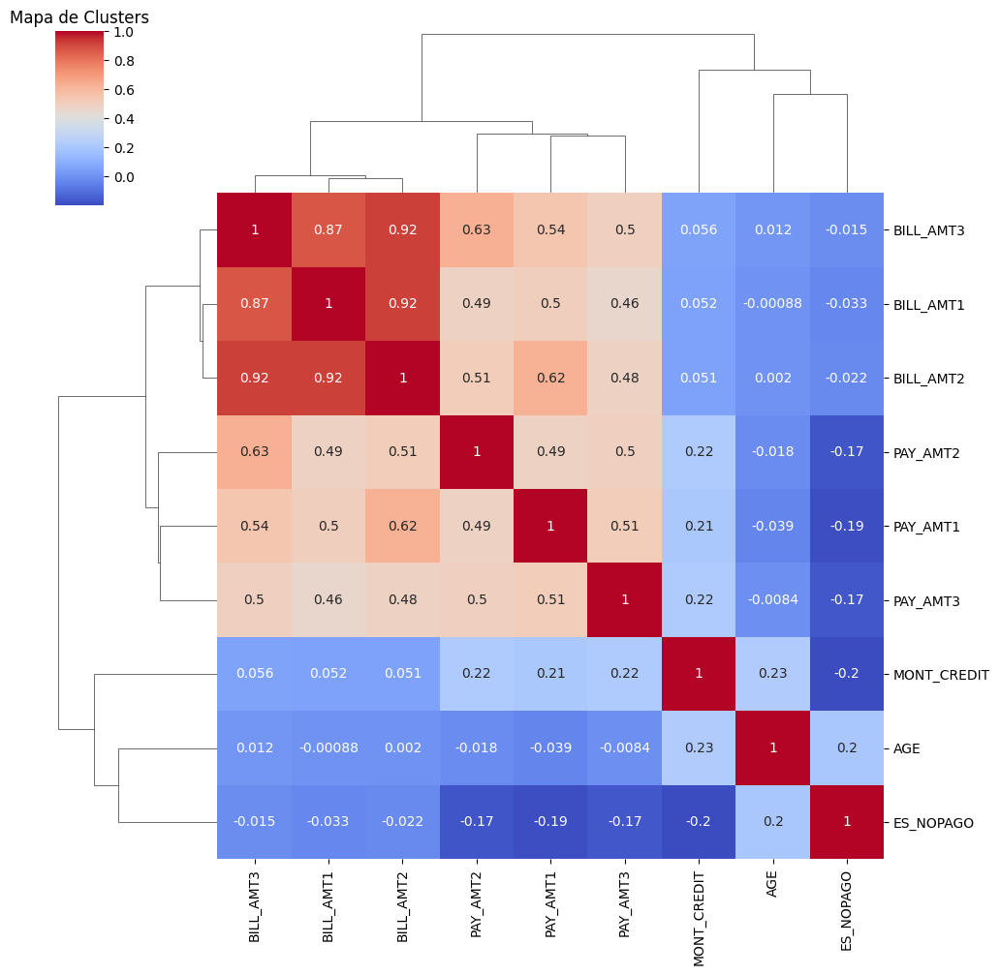

In [17]:
# Crear un mapa de clusters
sns.clustermap(df_bi[cols_num].corr(method='spearman'), cmap='coolwarm', annot=True)
plt.title('Mapa de Clusters')
plt.show()

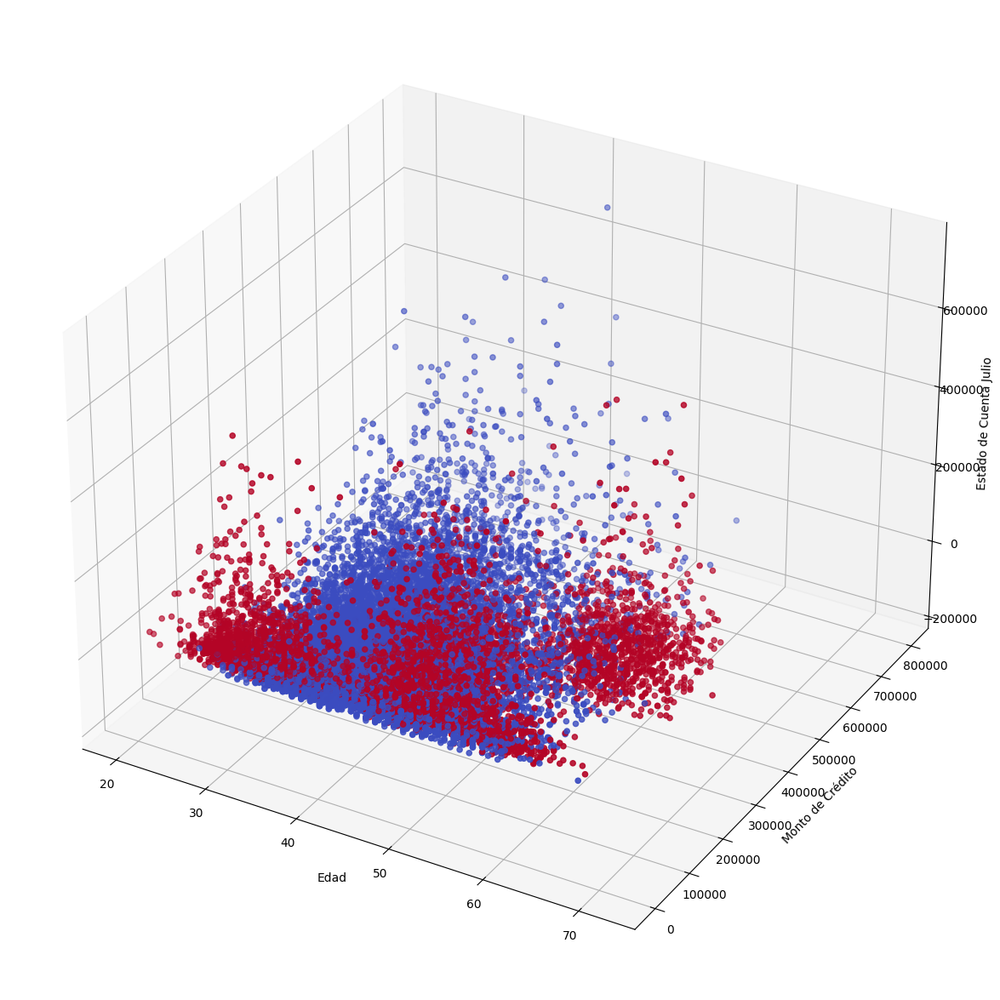

In [18]:
# Crear un gráfico de dispersión en 3D
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_bi['AGE'], df_bi['MONT_CREDIT'], df_bi['BILL_AMT1'], c=df_bi['ES_NOPAGO'], cmap='coolwarm')
ax.set_xlabel('Edad')
ax.set_ylabel('Monto de Crédito')
ax.set_zlabel('Estado de Cuenta Julio')
plt.show()


__*Variables categóricas - visualizaciones multivariadas*__

In [19]:
## ==> Gráfico para la visualización multivariada de datos categóricos (Frecuencia)
def grafico_multivariado_categoria_frecuencia(df: pd.DataFrame, x: str, segmen: str, rotation = 0, hue =  None) -> None:
    if hue is None:
        df_agrupado = df.groupby([x, segmen]).size().reset_index(name='Frecuencia')
        title = f'Distribución de : {x} segmentado por : {segmen}'
    else:
        df_agrupado = df.groupby([x, segmen, hue]).size().reset_index(name='Frecuencia')
       
        title = f'Distribución de : {x} segmentado por : {segmen} y {hue}'
        #print(title)

    fig = px.bar(
        df_agrupado, 
        x=x,
        y='Frecuencia',
        pattern_shape=hue,
        color=segmen, 
        barmode='group', 
        title=title,
        hover_data=[segmen]
    )
    fig.update_layout(
        xaxis_title= x,
        yaxis_title='Frecuencia',
        legend_title_text='Categoria',
        xaxis_tickangle=rotation,
        title_font_size=15,
        hoverlabel=dict(
        bgcolor="white",
        #font_size=16,
        #font_family="Rockwell"
        ),
        title={
            'x' : 0.5,
            'y' : 0.9,
            'xanchor': 'center',
            'yanchor': 'top',
        },
        margin=dict(l=0, r=0, t=80, b=0)
    )
    
    fig.show()

In [20]:
## ==> Gráfico para la visualización multivariada de datos categóricos y numerico (Frecuencia)
def grafico_multivariado_numerico_categoria(df: pd.DataFrame, x: str, segmen: str, y: str, rotation=0, hue=None) -> None:
    if hue is None:
        df_agrupado = df.groupby([x, segmen])[y].sum().reset_index(name='Total')
        title = f'Distribución de {y} por {x} segmentado por : {segmen}'
    else:
        df_agrupado = df.groupby([x, segmen, hue])[y].sum().reset_index(name='Total')
        title = f'Distribución de {y} por {x} segmentado por : {segmen} y {hue}'

    fig = px.bar(
        df_agrupado, 
        x=x,
        y='Total',
        pattern_shape=hue,
        color=segmen, 
        barmode='group', 
        title=title,
        hover_data=[segmen]
    )
    fig.update_layout(
        xaxis_title=x,
        yaxis_title=f'{y}',
        legend_title_text='Categoria',
        xaxis_tickangle=rotation,
        title_font_size=15,
        hoverlabel=dict(
            bgcolor="white"
        ),
        title={
            'x': 0.5,
            'y': 0.9,
            'xanchor': 'center',
            'yanchor': 'top',
        },
        margin=dict(l=0, r=0, t=80, b=0)
    )
    
    fig.show()


In [21]:
## ==> Gráfico para la visualización multivariada de datos categóricos BOXPLOT (Frecuencia)
def grafico_boxplot_categoria_numerico(df: pd.DataFrame, x: str, y: str, color: str, rotation=0) -> None:
    fig = px.box(
        df, 
        x=x,
        y=y,
        color=color, 
        title=f'Distribución de {y} por {x} segmentado por {color}',
        points='all'  # Para mostrar todos los puntos
    )
    fig.update_layout(
        xaxis_title=x,
        yaxis_title=y,
        legend_title_text='Categoria',
        xaxis_tickangle=rotation,
        title_font_size=15,
        hoverlabel=dict(
            bgcolor="white"
        ),
        title={
            'x': 0.5,
            'y': 0.9,
            'xanchor': 'center',
            'yanchor': 'top',
        },
        margin=dict(l=0, r=0, t=80, b=0)
    )
    
    fig.show()

In [22]:
df_bi['ES_NOPAGO'] = df_bi['ES_NOPAGO'] = change_type_target(df_bi['ES_NOPAGO'],'C')

In [23]:
#IDEAL PARA VER LA DISTRIBUCION MULTIVARIABLE DE CATEGORICA (FRECUENCIA) CON SUMATORIA
grafico_multivariado_categoria_frecuencia(
    df=df_bi, 
    x='ES_NOPAGO', 
    segmen='EST_CIVIL', 
    hue='SEX',
    rotation=0
)

In [24]:
#IDEAL PARA VER LA DISTRIBUCION MULTIVARIABLE DE NUMERICA Y CATEGORICA CON SUMATORIA
grafico_multivariado_numerico_categoria(
    df=df_bi, 
    x='PAY_3', 
    segmen='ES_NOPAGO', 
    y='BILL_AMT3', 
    hue='SEX',
    rotation=-25
)

In [25]:
#IDEAL PARA DETECTAR OUTLIERS
grafico_boxplot_categoria_numerico(
    df=df_bi, 
    x='PAY_3', 
    y='BILL_AMT3', 
    color='ES_NOPAGO', 
    rotation=-25
)


In [26]:
### ==> TÉCNICA DEL CHI CUADRADO PARA VERIFICAR SI EXISTE UNA ASOCIACIÓN ENTRE VARIABLES CATEGÓRICAS
nivel_significancia = 0.05

columns_cat = list(df_bi.select_dtypes(include=['O']).columns)
for column in columns_cat:
    contigency_table = pd.crosstab(df_bi['ES_NOPAGO'], df_bi[column])
    chi_cuadrado, p, dof, _ = chi2_contingency(contigency_table)
    valor_critico = chi2.ppf(1 - nivel_significancia, dof )

    print(f"**********{column}**********")
    print("Estadístico chi-cuadrado: {:.6f}".format(chi_cuadrado))
    print("Valor p: {:.6f}".format(p))
    print("Grados de libertad:", dof) 
    print("Valor crítico:", valor_critico) 
    if p < nivel_significancia:
        print('Rechazamos H0 (Hipotesis nula) : Existe una asociación significativa entre las variables --> Ideal para modelo ML')
    else:
        print('No rechazamos H0 (Hipotesis nula) : No hay evidencia existente que pueda afirmar una relación entre las variables')
    print("\n")


**********EST_CIVIL**********
Estadístico chi-cuadrado: 170.502335
Valor p: 0.000000
Grados de libertad: 2
Valor crítico: 5.991464547107979
Rechazamos H0 (Hipotesis nula) : Existe una asociación significativa entre las variables --> Ideal para modelo ML


**********NIV_EDUC**********
Estadístico chi-cuadrado: 214.761392
Valor p: 0.000000
Grados de libertad: 3
Valor crítico: 7.814727903251179
Rechazamos H0 (Hipotesis nula) : Existe una asociación significativa entre las variables --> Ideal para modelo ML


**********SEX**********
Estadístico chi-cuadrado: 572.544562
Valor p: 0.000000
Grados de libertad: 1
Valor crítico: 3.841458820694124
Rechazamos H0 (Hipotesis nula) : Existe una asociación significativa entre las variables --> Ideal para modelo ML


**********PAY_1**********
Estadístico chi-cuadrado: 3047.678810
Valor p: 0.000000
Grados de libertad: 4
Valor crítico: 9.487729036781154
Rechazamos H0 (Hipotesis nula) : Existe una asociación significativa entre las variables --> Ideal par

### __Conclusiones del análisis multivariado__

* En el gráfico de Scatter plot se evidencia que las variables BILL_AMT1-BILL_AMT2-BILL_AMT3 están altamente correlacionados, los mismo ocurre para las variables PAY_1, PAY_2, PAY_3 con respecto a BILL_AMT[1-2-3].
* En el grafico de HeatMap se evidencia aún más las correlaciones con valores.
* Con el grafico de Boxplot donde se coloca tanto variables numéricas como categóricas, se detectan así mismo outliers (se debe usar un esacalamiento).
* Debido a la alta correlación de variables BILL_AMT1-BILL_AMT2-BILL_AMT3, estas variables están fuertemente relacionadas entre sí y su concepto es el mismo, por lo que no aportaran un valor significativo a la hora de entrenar al modelo con estas variables. En este caso eliminare BILL-AMT3 / BILL-AMT2, de ser así, también tendría que eliminar PAY_3 / PAY_2 y PAY_AMT3 y PAY_AMT2.
* Con respecto a las variables categóricas, se usó la técnica del chi-cuadrado dando un resultado de que todas las variables tienen asociación significativa (Rechazamos H0). Por ende, usaremos todas estas variables.


__*Creación de nuevas variables*__

In [27]:
# ==> MESES AL DIA : Numero de veces que el cliente ha estado al dia, a partir de 3 meses 
df_bi['MESES_AL_DIA'] = df_tc[['PAY_1','PAY_2','PAY_3']].apply(lambda x: (x=='pago debido').sum(), axis=1)
# ==> VARIACION DEL TOTAL DE CUENTA : Diferencia entre el ultimo importe del mes restado con el minimo de los demas importe
df_bi['VARIACION_TOTAL_CUENTA'] = df_tc['BILL_AMT1'] - df_bi[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3']].min(axis=1)


In [28]:
df_bi.dtypes

MONT_CREDIT               float64
EST_CIVIL                  object
NIV_EDUC                   object
SEX                        object
AGE                         int64
PAY_1                      object
PAY_2                      object
PAY_3                      object
BILL_AMT1                 float64
BILL_AMT2                 float64
BILL_AMT3                 float64
PAY_AMT1                  float64
PAY_AMT2                  float64
PAY_AMT3                  float64
ES_NOPAGO                  object
MESES_AL_DIA                int64
VARIACION_TOTAL_CUENTA    float64
dtype: object

*Verificando si tiene correlacion nuestras variables creadas con respecto a las demas*

In [29]:
#TECNICA DEL CHI CUADRADO
nivel_significancia = 0.05
contigency_table = pd.crosstab(df_bi['ES_NOPAGO'], df_bi['MESES_AL_DIA'])
chi_cuadrado, p, dof, _ = chi2_contingency(contigency_table)
valor_critico = chi2.ppf(1 - nivel_significancia, dof )
print("Estadístico chi-cuadrado: {:.6f}".format(chi_cuadrado))
print("Valor p: {:.6f}".format(p))
print("Grados de libertad:", dof) 
print("Valor crítico:", valor_critico) 
if p < nivel_significancia:
    print('Rechazamos H0 (Hipotesis nula) : Existe una asociación significativa entre las variables --> Ideal para modelo ML')
else:
    print('No rechazamos H0 (Hipotesis nula) : No hay evidencia existente que pueda afirmar una relación entre las variables')


Estadístico chi-cuadrado: 2998.472962
Valor p: 0.000000
Grados de libertad: 3
Valor crítico: 7.814727903251179
Rechazamos H0 (Hipotesis nula) : Existe una asociación significativa entre las variables --> Ideal para modelo ML


C:\Users\Dell\AppData\Local\Temp\ipykernel_5796\1800188978.py:10: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



<Figure size 1500x1000 with 0 Axes>

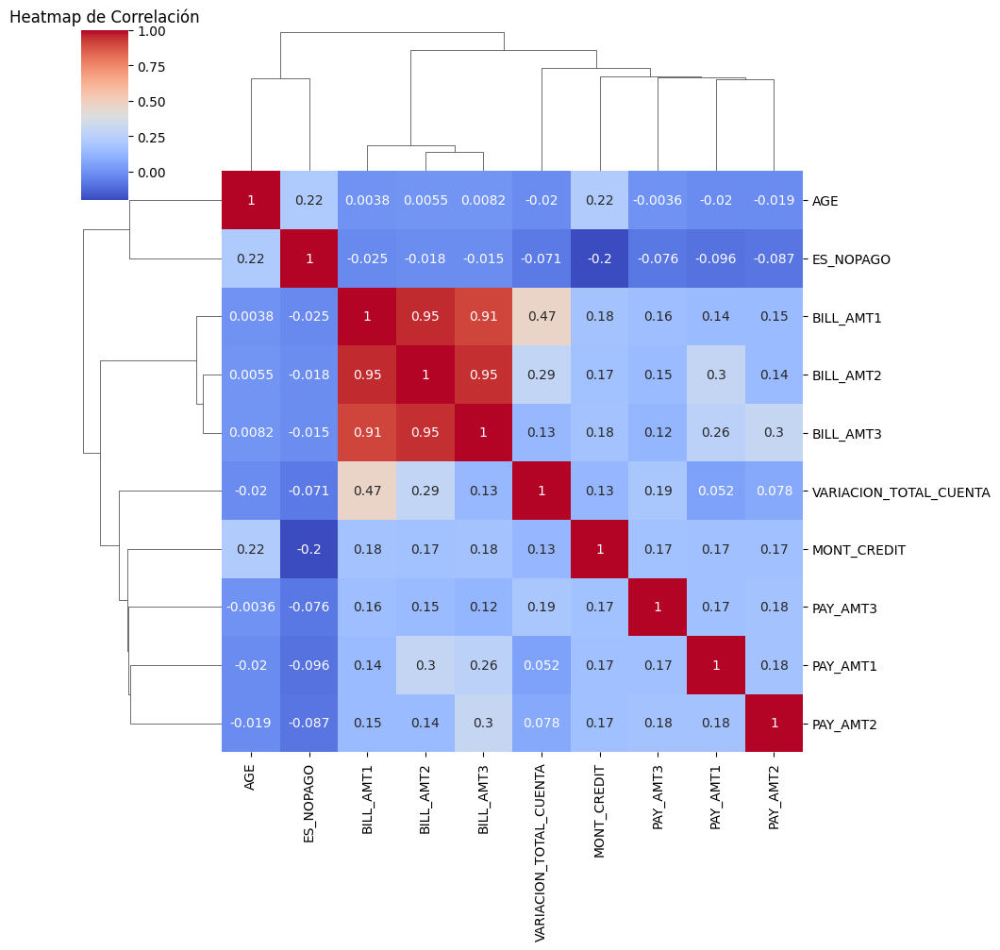

In [30]:
#Correlacion entres variables
plt.figure(figsize=(15,10))
df_bi['ES_NOPAGO'] = change_type_target(df_bi['ES_NOPAGO'],'O')
cols_num = ['MONT_CREDIT','AGE','BILL_AMT1','BILL_AMT2','BILL_AMT3','PAY_AMT1','PAY_AMT2','PAY_AMT3','ES_NOPAGO','VARIACION_TOTAL_CUENTA']
correlation_matrix = df_bi[cols_num].corr()
sns.clustermap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Heatmap de Correlación')
plt.show()

__*Motivo por el cual se crean estas nuevas variables*__

* __MESES_AL_DIA:__ En el gráfico de distribución, existe una alta demanda de los clientes que pagan a  tiempo, este también refleja el comportamiento histórico del cliente, por lo que si el cliente ha pagado a tiempo durante varias ocasiones, tendrá un comportamiento crediticio.

* __VARIACION_TOTAL_CUENTA:__ Se incluye para ver como ha cambiado el saldo del cliente a varios meses. SI el saldo tiene un cambio muy drástico refleja que el cliente tiene problemas financieros, por lo que es propenso a no cumplir con el pago.

__*técnicas de chi cuadrado y el grafico de correlación empleadas en las nuevas variables*__

* Se detecta que la variable MESES AL DIA también rechaza la hipótesis nula, por lo que tiene una asociación significativa con NO_PAGO
* Se verifica en el gráfico de correlación que la variable MONTO CREDITO esta relacionado con VARIACION DEL TOTAL DE CUENTA 


## __MODELADO PARA MACHINE LEARNING__

In [31]:
df_ml = df_bi.copy()
df_ml.drop(columns=['BILL_AMT3','BILL_AMT2','PAY_AMT3','PAY_AMT2','PAY_3','PAY_2'],inplace=True)
df_ml.head(2)

,MONT_CREDIT,EST_CIVIL,NIV_EDUC,SEX,AGE,PAY_1,BILL_AMT1,PAY_AMT1,ES_NOPAGO,MESES_AL_DIA,VARIACION_TOTAL_CUENTA
0,30000.0,casado,posgrado,femenino,40,pago debido,24607.0,1700.0,0,3,726.0
1,20000.0,casado,posgrado,femenino,41,retraso en el pago de un mes,17040.0,0.0,0,1,566.0


In [32]:
#Transformamos a ordinal las variables que poseen un orden
rp_niv_edu_inverse = {v: k for k, v in rp_niv_edu.items()}
rp_pay_inverse = {v: k for k, v in rp_pay.items()}
rp_es_nopago_inverse = {v : k for k,v in rp_es_nopago.items()}


df_ml['NIV_EDUC'] = df_ml['NIV_EDUC'].replace(rp_niv_edu_inverse)
df_ml['PAY_1'] = df_ml['PAY_1'].replace(rp_pay_inverse)
df_ml['ES_NOPAGO'] = df_ml['ES_NOPAGO'].replace(rp_es_nopago_inverse)
df_ml.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_5796\2238428400.py:7: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`

C:\Users\Dell\AppData\Local\Temp\ipykernel_5796\2238428400.py:8: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,MONT_CREDIT,EST_CIVIL,NIV_EDUC,SEX,AGE,PAY_1,BILL_AMT1,PAY_AMT1,ES_NOPAGO,MESES_AL_DIA,VARIACION_TOTAL_CUENTA
0,30000.0,casado,1,femenino,40,0,24607.0,1700.0,0,3,726.0
1,20000.0,casado,1,femenino,41,1,17040.0,0.0,0,1,566.0
2,20000.0,casado,1,femenino,36,0,17332.0,1580.0,0,3,0.0
3,20000.0,casado,1,femenino,35,0,2003.0,1086.0,0,3,0.0
4,170000.0,casado,1,femenino,38,0,171465.0,18500.0,0,3,61302.0


In [33]:
## ==> Transformamos a One Hot Encoder para datos que no tienen orden
columns_encoder = ['SEX','EST_CIVIL']
cat = df_ml[columns_encoder]
ohe = OneHotEncoder(sparse_output=False)# Este parametro es para que no devuelva una matriz sparse
ohe.fit(cat)
cat_ohe = ohe.transform(cat)
cat_ohe = pd.DataFrame(
    cat_ohe,
    columns = ohe.get_feature_names_out(input_features=cat.columns)
)
num = df_ml.select_dtypes(include=["number"])
df_ml = pd.concat([cat_ohe.reset_index(drop=True), num.reset_index(drop=True)], axis=1)
df_ml.head()

,SEX_femenino,SEX_musculino,EST_CIVIL_casado,EST_CIVIL_otros,EST_CIVIL_soltero,MONT_CREDIT,NIV_EDUC,AGE,PAY_1,BILL_AMT1,PAY_AMT1,ES_NOPAGO,MESES_AL_DIA,VARIACION_TOTAL_CUENTA
0,1.0,0.0,1.0,0.0,0.0,30000.0,1,40,0,24607.0,1700.0,0,3,726.0
1,1.0,0.0,1.0,0.0,0.0,20000.0,1,41,1,17040.0,0.0,0,1,566.0
2,1.0,0.0,1.0,0.0,0.0,20000.0,1,36,0,17332.0,1580.0,0,3,0.0
3,1.0,0.0,1.0,0.0,0.0,20000.0,1,35,0,2003.0,1086.0,0,3,0.0
4,1.0,0.0,1.0,0.0,0.0,170000.0,1,38,0,171465.0,18500.0,0,3,61302.0


In [34]:
X = df_ml.drop(columns=['ES_NOPAGO'])
y = df_ml['ES_NOPAGO']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3, random_state=00000)

In [35]:
num_columns_standar = ['MONT_CREDIT','AGE','BILL_AMT1','PAY_AMT1','VARIACION_TOTAL_CUENTA']
scaler = StandardScaler()
X_train[num_columns_standar] = scaler.fit_transform(X_train[num_columns_standar])
X_test[num_columns_standar] = scaler.transform(X_test[num_columns_standar])

__*Entrenamiento de 2 modelos, usando optimización de parámetros*__

In [36]:
warnings.filterwarnings('ignore')
params_gbc = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 1.0], 
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2, 3, 4, 5],
    'max_features': [None, 'sqrt', 'log2']

}

model_gbc = GradientBoostingClassifier()

clf_gbc= RandomizedSearchCV(model_gbc,params_gbc,scoring='accuracy',cv=5, verbose=0, n_jobs=-1 , random_state=876)

clf_gbc = clf_gbc.fit(X_train,y_train)

print(f'Mejores parametros: {clf_gbc.best_params_}')
print(f'Mejor score: {clf_gbc.best_score_}')
print(f'Mejor estimador: {clf_gbc.best_estimator_}')

Mejores parametros: {'subsample': 1.0, 'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': None, 'max_depth': 5, 'learning_rate': 0.1}
Mejor score: 0.8925838837965199
Mejor estimador: GradientBoostingClassifier(max_depth=5, min_samples_leaf=5, min_samples_split=4,
                           n_estimators=200)


In [37]:
param_grid_tree = {
    'max_depth': [5, 10, 20, 30], 
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 2, 4] 
}


model_tree = DecisionTreeClassifier()

clf_tree= RandomizedSearchCV(model_tree,param_grid_tree,scoring='accuracy',cv=5, verbose=0, n_jobs=-1 , random_state=876)

clf_tree = clf_tree.fit(X_train,y_train)

print(f'Mejores parametros: {clf_tree.best_params_}')
print(f'Mejor score: {clf_tree.best_score_}')
print(f'Mejor estimador: {clf_tree.best_estimator_}')

Mejores parametros: {'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 10}
Mejor score: 0.8530540184920188
Mejor estimador: DecisionTreeClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=5)


## __MÉTRICAS DE EVALUACIÓN DEL MODELO__

In [38]:
## ==> Gracias a la optimización de parámetros, ahora se crear al modelo a partir de esos hiperparametros
model_gbc = GradientBoostingClassifier(
    learning_rate=0.2, max_depth=5, min_samples_leaf=4, random_state= 00000
)
model_gbc = model_gbc.fit(X_train,y_train)
y_predicciones = model_gbc.predict(X_test)
y_probabilidades = model_gbc.predict_proba(X_test)

accuracy_score_gbc = sk_metrics.accuracy_score(y_test,y_predicciones)
preccision_gbc = sk_metrics.precision_score(y_test, y_predicciones, average='weighted')
recall_gbc = sk_metrics.recall_score(y_test,y_predicciones, average='weighted')
f1_gbc = sk_metrics.f1_score(y_test, y_predicciones, average='weighted')



In [39]:
print('===================> Evaluacion')
print('Accuracy : {:.6f}'.format(accuracy_score_gbc))
print('Presicion : {:.6f}'.format(preccision_gbc))
print('Recall : {:.6f}'.format(recall_gbc))
print('F1 Score : {:.6f}'.format(f1_gbc))


===================> Evaluacion
Accuracy : 0.883119
Presicion : 0.882942
Recall : 0.883119
F1 Score : 0.883012


In [40]:
print(classification_report(y_test, y_predicciones))

              precision    recall  f1-score   support

           0       0.90      0.91      0.90      2963
           1       0.86      0.85      0.86      2025

    accuracy                           0.88      4988
   macro avg       0.88      0.88      0.88      4988
weighted avg       0.88      0.88      0.88      4988



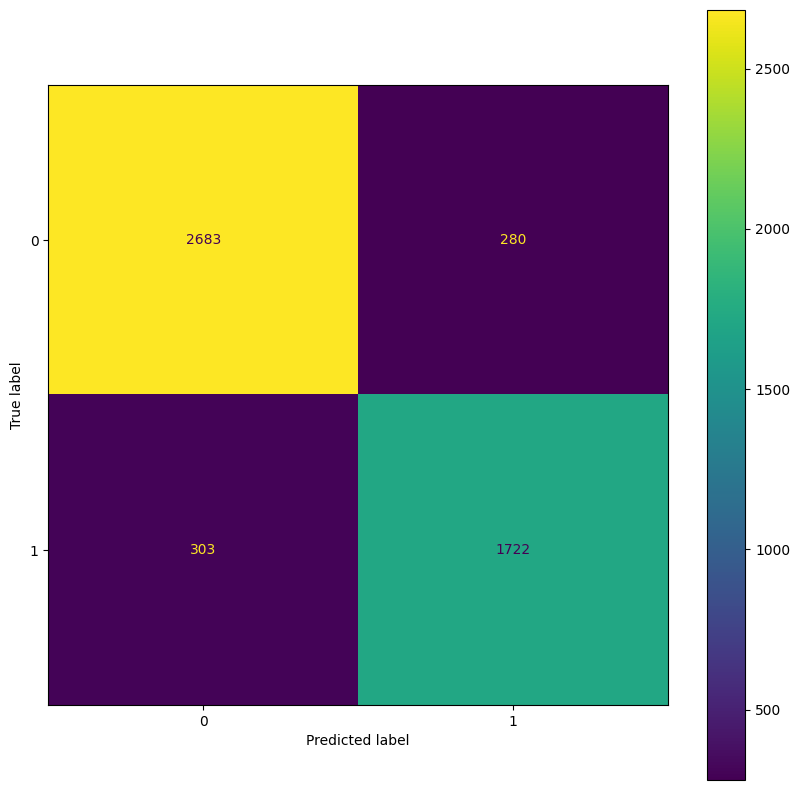

In [41]:
## ==> Matriz de confusion
fig, ax = plt.subplots(figsize=(10,10))
cm = sk_metrics.confusion_matrix(y_test, y_predicciones)
disp = sk_metrics.ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(ax=ax)
plt.show()


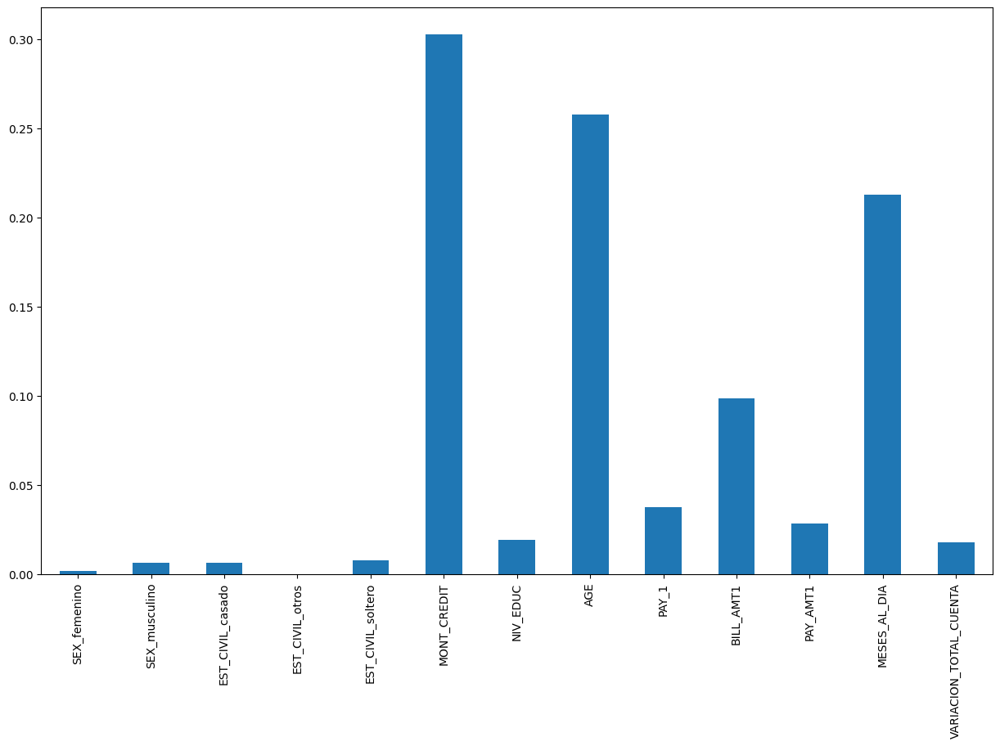

In [42]:
## ==> Pesos de las variables o features mas importantes para el modelo
importancia = model_gbc.feature_importances_
weights = pd.Series(
    importancia,
    index=X.columns
)
weights.plot(kind='bar', figsize=(15, 9))
plt.show()

### Mejor modelo que se ajusta más a los datos

**Gradient Boosting Classifier** ha sido seleccionado como el mejor modelo debido a las siguientes razones:

#### Optimización de Hiperparámetros:
- Se utilizó `RandomizedSearchCV` para ajustar los hiperparámetros del modelo Gradient Boosting Classifier, incluyendo `learning_rate`, `n_estimators`, `subsample`, `max_depth`, `min_samples_split`, `min_samples_leaf` y `max_features`. Esto permitió identificar la combinación óptima de hiperparámetros que maximiza el rendimiento del modelo.
- Los mejores hiperparámetros encontrados fueron: `'subsample': 1.0, 'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 5, 'learning_rate': 0.2`. Su score fue: `0.8845055134924398`.

#### Rendimiento Predictivo:
- Gracias a `RandomizedSearchCV` se ajustaron los hiperparámetros del modelo, con ello mostró las métricas más altas en comparación con Logistic Regression y Decision Tree Classifier:
  - **Accuracy:** 0.883119
  - **Precision:** 0.882942
  - **Recall:** 0.883119
  - **F1 Score:** 0.883012


#### Conclusiones del modelo
- El modelo Gradient Boosting Classifier, al ofrecer el mejor rendimiento predictivo, permite tomar decisiones más informadas y precisas. También ofrecerá la probabilidad de que un cliente no pague y esa probabilidad se podrá usar para ajustar una tasa de interés en función del nivel de riesgo del cliente, optimizando así la tasa de interés.
- Fundamental pues respalda la automatización del negocio y mejora la eficiencia en la gestión de riesgos financieros.
- Se utilizaron técnicas para obtener las características con mas peso para el modelo, de las cuales fueron: MONT_CREDIT, AGE, MESES_AL_DIA, BILL_AMT1, PAY_1

## __PRUEBAS CON EL MODELO GBC__

In [43]:
def replace_columns_for_predictions(df: pd.DataFrame)-> pd.DataFrame:
    rp_niv_edu_inverse = {v: k for k, v in rp_niv_edu.items()}
    rp_pay_inverse = {v: k for k, v in rp_pay.items()}

    df['NIV_EDUC'] = df['NIV_EDUC'].replace(rp_niv_edu_inverse)
    df['PAY_1'] = df['PAY_1'].replace(rp_pay_inverse)    
    return df


In [44]:
#Funcion que se encarga de predecir

def gbc_prediction(raw_data):
    try:
        raw_data_df = pd.DataFrame(raw_data)
        data_df = replace_columns_for_predictions(raw_data_df)
        cat_prueba = data_df[columns_encoder]
        cat_ohe_prueba = ohe.transform(cat_prueba)
        cat_ohe_prueba = pd.DataFrame(
        cat_ohe_prueba, columns=ohe.get_feature_names_out(input_features=cat_prueba.columns)
        )
        #Seleccionamos las numericas
        num = data_df.select_dtypes(include=['number'])
        #Concatenamos
        data = pd.concat([cat_ohe_prueba.reset_index(drop=True), num.reset_index(drop=True)], axis=1)
        #Estandarizamos 
        data[num_columns_standar] = scaler.transform(data[num_columns_standar])
        #Predecimos
        result = model_gbc.predict(data)
        probabilidades = model_gbc.predict_proba(data)
        raw_data_df['ES_NOPAGO'] = result
        probabilidad_sipago = [x[0] for x in probabilidades]
        probabilidad_nopago = [x[1] for x in probabilidades]
        raw_data_df['PROBABILIDAD_SIPAGO'] = probabilidad_sipago
        raw_data_df['PROBABILIDAD_NOPAGO'] = probabilidad_nopago
        return raw_data_df,result,probabilidades
    except Exception as e:
        return f'[ERROR] --> No se pudo precedir correctamente, [MENSAJE DEL SERVIDOR]-->: {str(e)}'

In [45]:
dato_prueba_json = [
    {
            'SEX': 'femenino',
            'EST_CIVIL' : 'soltero',
            'MONT_CREDIT' : 1000,
            'NIV_EDUC': 'otros',
            'AGE': 45,
            'PAY_1' : 'pago debido',
            'BILL_AMT1': 2600,
            'PAY_AMT1' : 1800,
            'MESES_AL_DIA' : 1,
            'VARIACION_TOTAL_CUENTA' : 3800
    },
    {
            'SEX': 'musculino',
            'EST_CIVIL' : 'casado',
            'MONT_CREDIT' : 1000,
            'NIV_EDUC': 'universidad',
            'AGE': 18,
            'PAY_1' : 'pago debido',
            'BILL_AMT1': 160,
            'PAY_AMT1' : 50,
            'MESES_AL_DIA' : 0,
            'VARIACION_TOTAL_CUENTA' : 5000
    },
    {
            'SEX': 'femenino',
            'EST_CIVIL': 'soltero',
            'MONT_CREDIT': 5000,
            'NIV_EDUC': 'otros',
            'AGE': 70,
            'PAY_1': 'retraso en el pago de un mes',
            'BILL_AMT1': 1500,
            'PAY_AMT1': 500,
            'MESES_AL_DIA': 2,
            'VARIACION_TOTAL_CUENTA': 1000
    },
    
    
]

df_predictions,result,probabilidades = gbc_prediction(dato_prueba_json)
df_predictions

,SEX,EST_CIVIL,MONT_CREDIT,NIV_EDUC,AGE,PAY_1,BILL_AMT1,PAY_AMT1,MESES_AL_DIA,VARIACION_TOTAL_CUENTA,ES_NOPAGO,PROBABILIDAD_SIPAGO,PROBABILIDAD_NOPAGO
0,femenino,soltero,1000,4,45,0,2600,1800,1,3800,0,0.990540,0.009460
1,musculino,casado,1000,2,18,0,160,50,0,5000,0,0.645759,0.354241
2,femenino,soltero,5000,4,70,1,1500,500,2,1000,1,0.264652,0.735348


Se realizaron 3 pruebas para el modelo, tomando en consideración las variables más influyentes (edad, meses al día, entre otros). Los resultados que se obtuvieron para dos ejemplos, fueron los siguientes:
- **Primer cliente**: probabilidad de pago 0.99 y de no pago 0.01. Resultado: Sí pago.
- **Ultimo cliente**: probabilidad de pago 0.26 y de no pago 0.73. Resultado: No pago.

#### __El modelo con los resultados obtenidos, ayudara a los siguientes departamento:__

*Gestión de Riesgos*

- Las probabilidades de no pago pueden ser utilizadas para ajustar las políticas de crédito y las tasas de interés. Por ejemplo, un cliente con alta probabilidad de no pago podría ser sujeto a una tasa de interés más alta para compensar el riesgo.

*Cobranza*

- La empresa puede priorizar sus esfuerzos de cobranza enfocándose en los clientes con alta probabilidad de no pago, optimizando así los recursos.

*Marketing*

- Los clientes con baja probabilidad de no pago pueden recibir ofertas de crédito más atractivas o beneficios adicionales, mejorando la fidelización del cliente.


## __Estrategia para ajustar las tasas de interés en función del nivel de riesgo de los clientes__

__Ahora ajustaremos una tasa de interes de acuerdo al nivel de riesgo del cliente__

Para evaluar la tasa de interés en función del nivel de riesgo del cliente, se deben tomar en consideración lo sigueint:

__*Tasa de Interés de Mora*__

1. **Tasa de Interés de Mora Establecida por el Banco Central del Ecuador:**
   Según el Banco Central del Ecuador, a los clientes se les cobra un máximo de 10% de interés sobre el interés que pagan mensualmente. Es decir:

   **Ejemplo:**
   - Si un cliente paga mensualmente un 10% de interés por su tarjeta de crédito, y ese cliente, por alguna circunstancia, no paga en un mes determinado, el recargo que se le puede hacer es de un máximo de 10% sobre el interés.
     - **Mora de interés = 10% + (10% * 0.1)**
     - **Mora de interés = 11%**

2. **Niveles de Interés por Mora en Función del Nivel de Riesgo:**
   Tomaremos en consideración que todos los clientes pagan un 10% mensualmente de su tarjeta de credito, luego podemos determinar diferentes niveles de interés por mora. Para ello se diseño la siguiente tabla que calculará la tasa de interés en función del nivel de riesgo:

   - No pago ≥ 90% y <= 100%
     - **Tasa de interés: 10% + 10% sobre el interés**
   - No pago ≥ 80% y < 90%:
     - **Tasa de interés: 10% + 8% sobre el interés**
   - No pago ≥ 70% y < 80%:
     - **Tasa de interés: 10% + 6% sobre el interés**
   - No pago ≥ 60% y < 70%:
     - **Tasa de interés: 10% + 4% sobre el interés**
   - No pago ≥ 50% y < 60%:
     - **Tasa de interés: 10% + 2% sobre el interés**
   - No pago < 50%
     - **Tasa de interés: 10% (mantiene)**

In [46]:
def tasa_interes(value):
  if value < 0.50:
    return 0.0
  elif value >= 0.50 and value < 0.60:
    return 0.02
  elif value >= 0.60 and value < 0.70:
    return 0.04
  elif value >= 0.70 and value < 0.80:
    return 0.06
  elif value >= 0.80 and value < 0.90:
    return 0.08
  elif value >= 0.90:
    return 0.10

In [47]:
df_copy = df_predictions.copy() 
df_copy['TASA_INTERES_MENSUAL'] = 0.10

In [48]:
df_copy['TASA_INTERES_MORA'] = df_copy['PROBABILIDAD_NOPAGO'].apply(tasa_interes) 
df_copy

,SEX,EST_CIVIL,MONT_CREDIT,NIV_EDUC,AGE,PAY_1,BILL_AMT1,PAY_AMT1,MESES_AL_DIA,VARIACION_TOTAL_CUENTA,ES_NOPAGO,PROBABILIDAD_SIPAGO,PROBABILIDAD_NOPAGO,TASA_INTERES_MENSUAL,TASA_INTERES_MORA
0,femenino,soltero,1000,4,45,0,2600,1800,1,3800,0,0.990540,0.009460,0.1,0.00
1,musculino,casado,1000,2,18,0,160,50,0,5000,0,0.645759,0.354241,0.1,0.00
2,femenino,soltero,5000,4,70,1,1500,500,2,1000,1,0.264652,0.735348,0.1,0.06


Finalmente, aplicando la lógica descrita, hemos logrado determinar la tasa de interés de un cliente en función de su nivel de riesgo. Esta tasa se ajusta dinámicamente, beneficiando tanto a la entidad financiera como a los clientes al proporcionar tasas más justas y equitativas basadas en la probabilidad de pago.

En resumen, este modelo no solo mejora la precisión en la evaluación del riesgo crediticio, sino que también optimiza las tasas de interés, lo que puede traducirse en una mejor gestión de recursos financieros y una mayor satisfacción del cliente. Este enfoque predictivo y adaptativo es un paso crucial hacia la modernización de los sistemas financieros, promoviendo prácticas más sostenibles y eficientes.

La implementación de este tipo de soluciones puede transformar significativamente la forma en que las instituciones financieras manejan el crédito y el riesgo, estableciendo un nuevo estándar en la industria. Si deseas conocer más sobre este proyecto o discutir cómo podría aplicarse en tu organización, ¡no dudes en contactarme!
